# UMAP
Metodo per la riduzione della dimensionalità, usato principalmente per fare analisi genomica delle singole cellule.

## Problemi di tSNE

* **tSNE non scala bene con la dimensione del campione**, sono state sviluppate versioni modificate di tSNE che scalano meglio, [FItSNe](https://www.nature.com/articles/s41592-018-0308-4) ma queste usano molta più memoria
* **tSNE non mantiene la struttura globale dei dati**, le uniche distanze di cui è garantito il mantenimento del significato sono quelle dei valori interni ai cluster mentre non lo è fra i cluster. Per questo tSNE non è una buona idea fare clustering con tSNE.
    ![](media/structure.png)
* **tSNE può, praticamente, fare embedding solo in 2 o 3 dimensioni**, quindi è utile solo per la visualizzazione, rendendone difficile l'utilizzo se lo si vuole utilizzare come tecnica di riduzione generica e.g. passare da 300 a 50 componenti (questo problema non è stato risolto nemmeno da FItSNE)
* **tSNE non può lavorare con campioni ad alta dimensionalità direttamente,** per questo spesso viene sfruttata PCA per ridurre la dimensionalità dei dati ancora prima di eseguire tSNE
* **tSNE utilizza troppa memoria**, quando si usa un valore di perplessità elevato, lo step iniziale di trovare i k vicini diventa meno efficiente e importante per la riduzione temporale (problema non risolto nemmeno da FItSNE)

## Differenze fra tSNE e UMAP

Umap e tSNE sono abbstanza simili: sono entrambi metodi che sfruttano il machine learning ed entrambi usano creano il  grafo dei vicini. La principale differenza è che mentre tSNE è un algoritmo semi empirico basato sul machine learning puro, UMAP si basa su solidi principi matematici.
* **UMAP si basa su solide fondamenta matematiche** che garantisco la qualità del risultato ottenuto
* **UMAP usa il numero di vicini**, al posto della perplessità usata in tSNE, questa formula, non avendo logaritmi al suo interno è molto meno costosa computazionalmente.
* **UMAP usa l'entropia incrociata**, invece della divergenza di Kullback-Leiber
* **UMAP inizializza le coordinate usando un grafo laplaciano**, invece di una inizializzazione random normale che usa tSNE. Questo non ha molto effetto sulle performance ma rende UMAP "meno" stocastico.

## Teoria di UMAP in breve
L'algoritmo di UMAP si divide in due step: 
1. Costruzione del grafo ad alta dimensionalità 
2. Trovare il grafo a bassa dimensionalità più simile possibile

Per compiere questi step, si basa su nozioni di [Topologia algebrica](https://it.wikipedia.org/wiki/Topologia_algebrica) e [Geometria di Riemman (o ellittica)](https://it.wikipedia.org/wiki/Geometria_ellittica). 

La matematica sottostante è abbastanza complicata ma le intuizioni che la guidano sono abbastanza semplici: UMAP costruisce un grafo pesato basato sui dati ad alta dimensionalità, il peso rappresenta quanto "vicino" un punto è rispetto ad un altro. Poi prende questo grafo e lo proietta su un grafo a dimensionalità ridotta.
La matematica alla base dell'algoritmo permette la creazione del grafo nonostante i dati siano ad alta dimensionalità.

### Costruzione del grafo ad alta dimensionalità 
#### Simplessi e topologia
Per creare il grafo ad alta dimensionalità iniziale, UMAP usa la Coomologia di Čech, un metodo per rappresentare una topologia in modo combinatorio (al posto di uno spazio continuo, usa degli insiemi).
Per fare ciò, useremò i simplessi. Un simplesso è un oggetto k-dimensionale formato connettendo k+1 punti.

![](media/simplex.png)

Pensando ai nostri dati come un insieme di simplessi, possiamo catturarne la topologia e combinandoli in uno specifico modo formando una Coomologia di Čech, abbiamo delle garanzie di quanto bene rappresenterà la topologia.
Iniziamo considerando ogni punto come appartenente a una forma continua ad alta dimensionalità (topologia). Ogni punto sarà un simplesso-0. 

![](media/points_radius.png)

Possiamo estendere da ogni punto una circonferenza di raggio $r$.

![](media/points_simplexes.png)

Connettendo i punti che si sovrappongono possiamo creare insiemi di simplessi a più alta dimensionalità.


#### Il problema del raggio
Sfortunatamente, come possiamo vedere dalle immagini sopra, non tutti i punti hanno dei collegamenti e abbiamo dei gruppi di punti isolati dagli altri. Uno dei problemi principali da risolvere è trovare il valore corretto per il raggio $r$. Un valore troppo piccolo causerà un isolamento maggiore e un valore troppo grande renderebbe tutto connesso. Questo problema è incrementato anche dalla [maledizione della dimensionalità](https://en.wikipedia.org/wiki/Curse_of_dimensionality), dove le distanze fra i punti diventano sempre più simili in spazi ad alta dimensionalità.

![](media/points_radius_neighbours.png)

Questo problema è risolto usando un raggio variabile determinato per ogni punto in base alla distanza al suo k-esimo vicino. All'interno di questo raggio, la coerenza è resa "fuzzy" rendendo ogni connessione una probabilità, i punti più lontani dal centro della circonferenza avranno meno probabilità di essere connessi ad esso. Dato che non vogliamo punti isolati, ogni punto dovrà essere connesso ad almeno il suo vicino più "vicino".

![](media/points_2_weights.png)

Il risultato di questo è un grafo pesato, i cui pesi rappresentano la probabilità che i due punti siano "connessi" nella nostra topologia ad alta dimensionalità.

![](media/points_weight.png)

Notare che, dato che ogni punto ha una nozione locale di distanza, questa potrebbe essere diversa da quella dei vicini. Per risolvere questa inconsistenza, UMAP, calcola la probabilità che almeno uno dei due esista.
Consideriamo il peso combinato $(a + b - a * b)$ come la probabilità che l'arco (simplesso-1) esista, quindi $(a + b - a * b)$ è la probabilità che almeno uno dei due esista.

#### Struttura
Questo complesso simpliciale (insieme di simplessi) fa un buon lavoro nell'approssimare gli elementi fondamentali della topologia del dataset ([Nerbo, Nerve Theorem](https://it.wikipedia.org/wiki/Nerbo_\(matematica\))).

Possiamo notare che la maggior parte della struttura della topologia è rappresentata dai simplessi-0 e -1, che costituiscono il [complesso di Vietoris-Rips](https://en.wikipedia.org/wiki/Vietoris%E2%80%93Rips_complex). Poter lavorare solo con questi due tipi di simplessi rende l'algoritmo molto più efficiente, specialmente su grossi dataset.

Considerando solamente i simplessi-0 e -1 abbiamo praticamente costruito il grafo ad alta dimensionalità e siamo pronti per trovare la sua controparte a bassa dimensionalità.

### Trovare il grafo a bassa dimensionalità più simile possibile
Una volta ottenuto il complesso simpliciale, viene proiettato ad una dimensionalità più bassa tramite un algoritmo di force-directed graph layout. Questo step di ottimizzazione è molto simile a tSNE (Entropia incrociata al posto di Kullback-Leibler), ma dato che la costruzione del complesso simpliciale era basata su buone fondamente matematiche, UMAP è in grado di accellerare questa ottimizzazione e preservare molta più struttura globale rispesso a tSNE.

Idealmente vorremmo che la rappresentazione a bassa dimensionalità rispetti il più possibile la nostra struttura topologica. Abbiamo 2 problemi principali:
1. Come determiniamo la struttura topologica di una rappresentazione a bassa dimensionalità?

Possiamo applicare nuovamente quanto fatto prima ma con delle semplificazioni: dato che stiamo lavorando in uno spazio euclideo, sappiamo che la struttura topologica è quella dello spazio euclideo. Questo rende tutta la parte precedente riguardante le varie distanze inutile quando si lavora a bassa dimensionalità perchè avrò un sistema di metriche costante. 

2. Come trovo una buona struttura topologica in cui rappresentare i miei dati?

Per risolvere questo ci serve un metodo per misurare quanto "vicini" siamo alla struttura topologica originaria. Una volta trovato questo metodo di misura possiamo rendere questo problema un problema di ottimizzazione.

Tornando indietro a quando risolvevamo il conflitto tra i pesi dei simplessi-0, abbiamo interpretato il peso come la probabilità dell'esistenza del simplesso. Quindi, dato che entrambe le strutture topologiche hanno gli stessi simplessi-0 possiamo confrontarle usando i vettori di probabilità indicizzati dai simplessi-1. Questi sono delle variabili aleatorie bernoulliane (alla fine, il simplesso o esiste o non esiste e la probabilità è il parametro della distribuzione bernoulliana) quindi la scelta corretta è l'entropia incrociata.

#### Entropia incrociata

Se l'insieme di tutti i possibili simplessi-1 è $E$ e abbiamo delle funzioni peso tali che ${\omega_h(e)}$ è il peso del simplesso-1 e nel caso ad alta dimensionalità e ${\omega_l(e)}$ è il peso nel caso a bassa dimensionalità, l'entropia incrociata sarà: 

$$\sum_{e \in E} \omega_h(e) \log{\left(\frac{\omega_h(e)}{\omega_l(e)}\right)} + (1 - \omega_h(e)) \log{\left(\frac{1-\omega_h(e)}{1-\omega_l(e)}\right)}$$

Tornano a pensare in termini di grafi possiamo considerare la minimazzione dell'entropia come un tipo di algoritmo per creare un force directed layout.

Il primo termine, $\omega_h(e) \log{\left(\frac{\omega_h(e)}{\omega_l(e)}\right)}$, è la forza attrattiva tra i punti coperti da $e$ nel caso in cui ci sia un alto peso associato al caso ad elevata dimensionalità. Questo perchè questo termine verrà minimizzata quanto ${\omega_l(e)}$ è più grande possibile, che accadrà quando la distanza fra i punti è il più piccolo possibile

Il secondo termine, $(1 - \omega_h(e)) \log{\left(\frac{1-\omega_h(e)}{1-\omega_l(e)}\right)}$, è la forza repulsiva quando $\omega_h(e)$ è piccolo. Questo perchè il termine verrà minimizzato quando $\omega_l(e)$ è più piccolo possibile.

Questo processo di attrazione e repulsione, mediato dai pesi degli archi nella rappresentazione ad alta dimensionalità permetterà alla rappresentazione a bassa dimensionalità di stabilirsi in uno stato che rappresenta in modo relativamente accurato la topologia dei dati di partenza.

#### Kullback Leibler vs Entropia incrociata
Consideriamo $X$ sia la distanza fra i punti ad alta dimensionalità e $Y$ sia la distanza fra i punti a bassa dimensionalità.

$$ P(X) \approx e^{-X^2} \quad \quad Q(Y) \approx \frac{1}{1+Y^2} $$

Dalla definizione di Kullback Leibler abbiamo:

$$ KL(X,Y) = P(X)\log{\frac{P(X)}{Q(Y)}} = P(X)\log{P(X)}-P(X)\log{Q(Y)}$$

Il primo termine è vicino a zero sia per valori alti che bassi di $X$. Va a 0 per $X$ piccole dato che l'esponente si avvicina a 1 e $log{(1)}=0$. Per $X$ grandi va comunque a 0 dato che $P(X) \approx e^{-X^2}$ va a 0 più velocemente di quanto il logaritmo va verso $-\infty$. Quindi possiamo considerare solo il secondo termine:

$$ KL(X,Y) \approx -P(X)\log{Q(Y)} = e^{-X^2}\log{(1+Y^2)}$$

Se la distanza fra i punti ad alta dimensionalità è piccola, l'esponenziale va a 1, quindi con valori grandi di $Y$ ci sarà una grossa penalità quindi tSNE cerca di ridurre $Y$ se $X$ è piccola per ridurre la penalità.

Con valori grandi di $X$, $Y$ può essere qualsiasi valore fra 0 e $\infty$ dato che l'esponenziale va a zero e vince sempre sul logaritmo. Per colpa di questo, punti lontani nel grafo ad alta dimensionalità possono finire vicini nella rappresentazione a bassa dimensionalità senza che vi sia una penalità come nel caso contrario.

tSNE non garantisce che punti lontani nella rappresentazione ad alta dimensionalità siano lontani in quella a bassa dimensionalità.


Definizione di entropia incrociata:

$$CE(X,Y) = P(X)\log{\frac{P(X)}{Q(Y)}}+(1-P(X))\log{\frac{1-P(X)}{1-Q(Y)}} =\\ 
=e^{-X^2}\log\left[e^{-X^2}(1+Y^2) \right] +\left( 1-e^{-X^2}\right)\log\left[\frac{(1-e^{-X^2})(1+Y^2)}{Y^2}\right] \approx \\
\approx e^{-X^2}\log{(1+Y^2)}+(1-e^{-X^2})\log{\left(\frac{1+Y^2}{Y^2} \right)}$$

Per valori piccoli di $X$ abbiamo lo stesso limite di prima con tSNE dato che il secondo termine sparisce:

$$ X\to 0: CE(X,Y) \approx \log{(1+Y^2)} $$

Quindi per minimizzare la penalità dovro cercare valori di $ Y \to 0$, esattamente come in tSNE.
Invece per valori di $X$ grandi, il primo termine sparisce e otteniamo:

$$ X\to \infty : CE(X,Y) \approx \log{\frac{1+Y^2}{Y^2}} $$

Qui con $Y$ piccole abbiamo una alta penalità, quindi $Y$ verrà incrementata per ottenere come risultato della frazione 1 ottenendo così 0 penalità, portandoci ad avere $Y \to \infty $ e $X \to \infty $.

Questo permette ad UMAP di mantenere sia le distanze locali che globali.

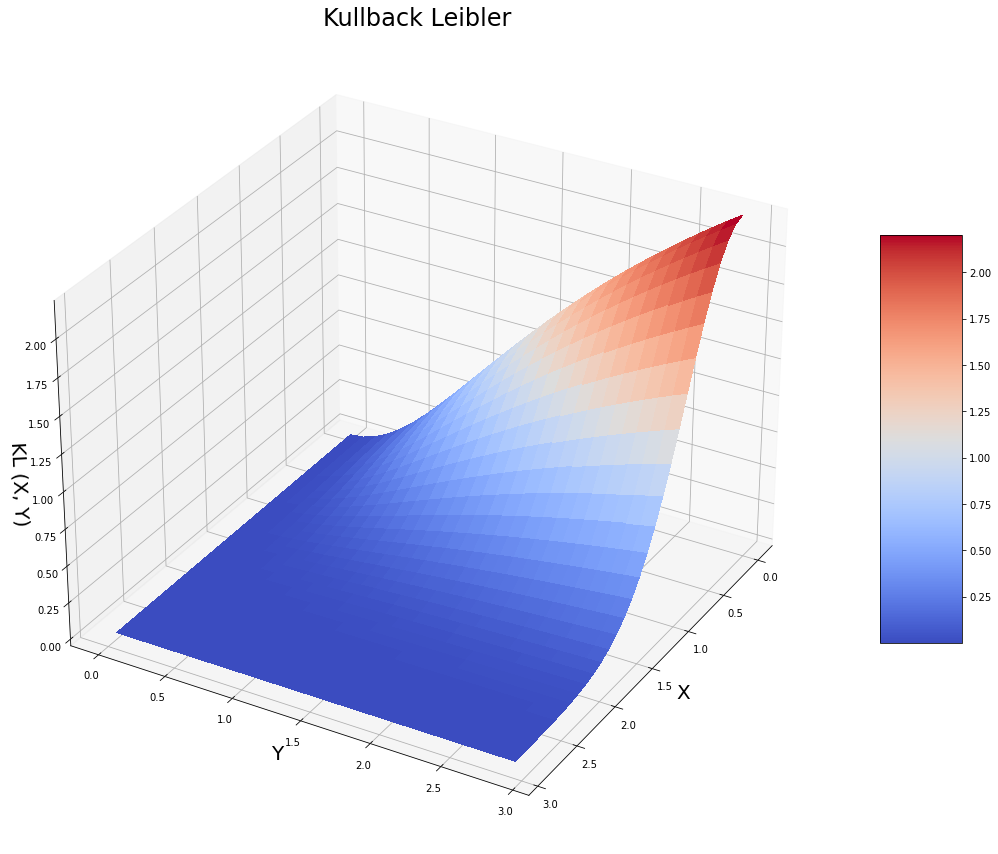

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import LinearLocator, FormatStrFormatter

fig = plt.figure(figsize=(20, 15))
plt.axes(projection = '3d')
ax = fig.gca()
# Set rotation angle to 30 degrees
ax.view_init(azim=30)

X = np.arange(0, 3, 0.1)
Y = np.arange(0, 3, 0.1)
X, Y = np.meshgrid(X, Y)
Z = np.exp(-X**2)*np.log(1 + Y**2)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,linewidth=0, antialiased=False)
ax.set_xlabel('X', fontsize = 20)
ax.set_ylabel('Y', fontsize = 20)
ax.set_zlabel('KL (X, Y)', fontsize = 20)
ax.set_zlim(0, 2.2)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title("Kullback Leibler", fontsize=24)
plt.show()

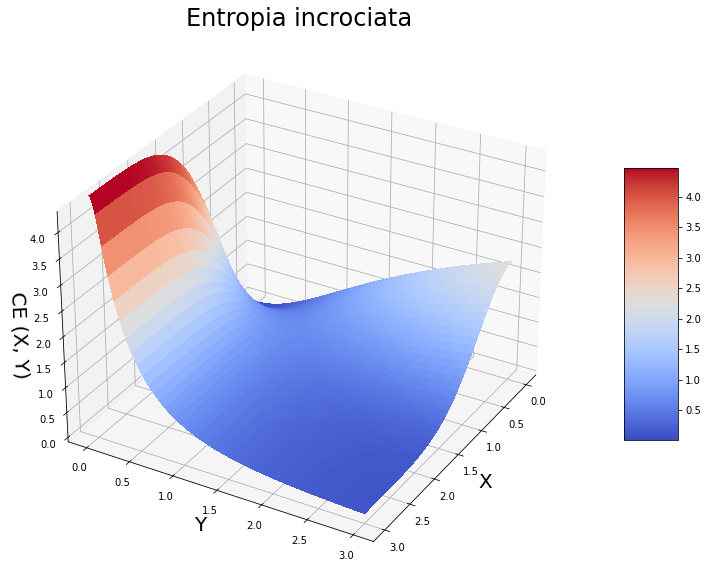

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import LinearLocator, FormatStrFormatter

fig = plt.figure(figsize=(19, 10))
plt.axes(projection = '3d')
ax = fig.gca() 
# Set rotation angle to 30 degrees
ax.view_init(azim=30)

X = np.arange(0, 3, 0.001)
Y = np.arange(0, 3, 0.001)
X, Y = np.meshgrid(X, Y)
Z = np.exp(-X**2)*np.log(1 + Y**2) + (1 - np.exp(-X**2))*np.log((1 + Y**2) / (Y**2+0.01))

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,linewidth=0, antialiased=False)
ax.set_xlabel('X', fontsize = 20)
ax.set_ylabel('Y', fontsize = 20)
ax.set_zlabel('CE (X, Y)', fontsize = 20)
ax.set_zlim(0, 4.3)

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title("Entropia incrociata", fontsize=24)
plt.show()

## Esempio di UMAP con il dataset delle cifre
----------------
Questo dataset contiene una serie di immagini con delle cifre scritte a mano. Ci sono 1797 immagini, ognuna descritta da 64 attributi (uno per ogni pixel, 8x8). Il dataset può essere diviso in 10 classi, una per ogni cifra (0,1,...,9).

In [3]:
import numpy as np
from sklearn.datasets import load_digits
from sklearn.preprocessing import StandardScaler
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import warnings
%matplotlib notebook
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = [19, 10]

digits = load_digits()
digits_df = pd.DataFrame(digits.data)
digits_df.head()

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0


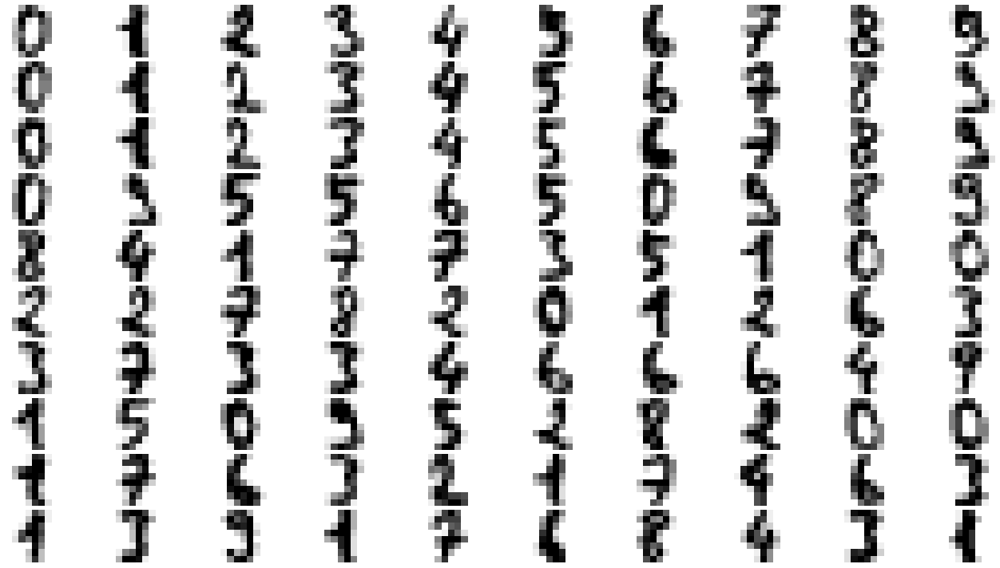

In [4]:
fig, ax_array = plt.subplots(10, 10)
axes = ax_array.flatten()
for i, ax in enumerate(axes):
    ax.imshow(digits.images[i], cmap='gray_r')
plt.setp(axes, xticks=[], yticks=[], frame_on=False)
plt.tight_layout(h_pad=0.5, w_pad=0.01)

In [6]:
def scatterplot_digits(embedding, algorithm_name, time):
    plt.scatter(embedding[:, 0], embedding[:, 1], c=digits.target, cmap='Spectral', s=5)
    plt.gca().set_aspect('equal', 'datalim')
    #Cleaning up image
    #plt.axis('off')
    plt.tick_params(left=False,
                bottom=False,
                labelleft=False,
                labelbottom=False)
    for pos in ['right', 'top', 'bottom', 'left']:
        plt.gca().spines[pos].set_visible(False)
    plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
    plt.title(f'{algorithm_name} projection of the Digits dataset (Size: {len(embedding)}, Time: {round(time,2)}s)', fontsize=24);

In [7]:
from io import BytesIO
from PIL import Image
import base64
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10

def embeddable_image_digits(data):
    img_data = 255 - 15 * data.astype(np.uint8)
    image = Image.fromarray(img_data, mode='L').resize((32, 32), Image.BICUBIC)
    buffer = BytesIO()
    image.save(buffer, format='png')
    for_encoding = buffer.getvalue()
    return 'data:image/png;base64,' + base64.b64encode(for_encoding).decode()

def interactive_scatterplot_digits(data, embedding, target):
    digits_df = pd.DataFrame(embedding, columns=('x', 'y'))
    digits_df['digit'] = [str(x) for x in target]
    digits_df['image'] = list(map(embeddable_image_digits, data))

    datasource = ColumnDataSource(digits_df)
    color_mapping = CategoricalColorMapper(factors=[str(9 - x) for x in range(0,10)],
                                           palette=Spectral10)

    plot_figure = figure(
        title='UMAP projection of the Digits dataset',
        plot_width=900, 
        plot_height=600,
        tools=('pan, wheel_zoom, reset')
    )

    plot_figure.add_tools(HoverTool(tooltips="""
    <div>
        <div>
            <img src='@image' style='float: left; margin: 5px 5px 5px 5px;'/>
        </div>
        <div>
            <span style='font-size: 16px; color: #224499'>Digit:</span>
            <span style='font-size: 18px'>@digit</span>
        </div>
    </div>
    """))

    plot_figure.circle(
        'x',
        'y',
        source=datasource,
        color=dict(field='digit', transform=color_mapping),
        line_alpha=0.6,
        fill_alpha=0.6,
        size=4
    )
    output_notebook()

    show(plot_figure)

In [9]:
import time
import umap
reducer_umap_digits = umap.UMAP(min_dist=0.7, n_neighbors=15)
start = time.time()
reducer_umap_digits = reducer_umap_digits.fit(digits.data) 
embedding_umap_digits = reducer_umap_digits.transform(digits.data)
umap_time_digits = time.time()-start
embedding_umap_digits.shape

(1797, 2)

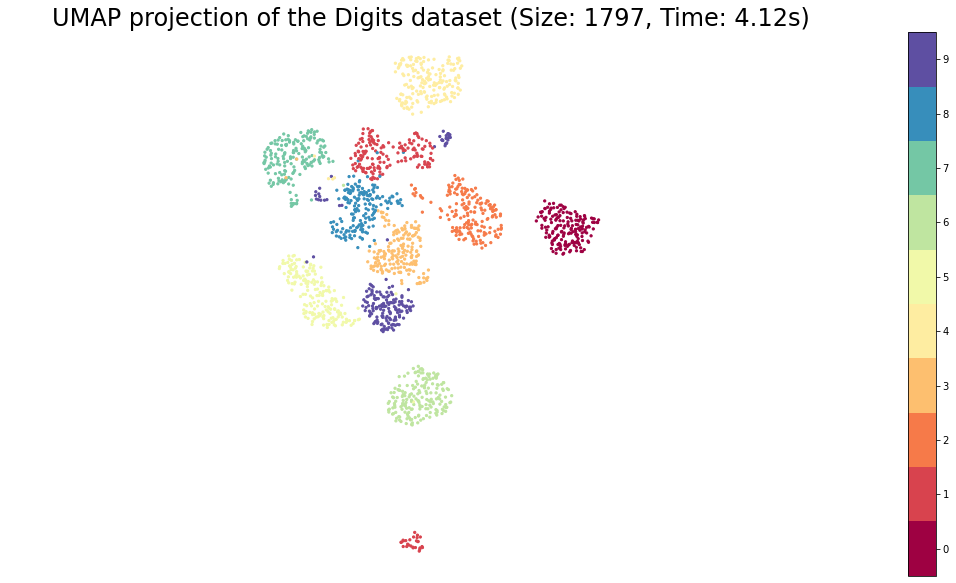

In [10]:
scatterplot_digits(embedding_umap_digits, 'UMAP', umap_time_digits)

In [11]:
interactive_scatterplot_digits(digits.images,embedding_umap_digits, digits.target)

Loading BokehJS ...

In [12]:
from sklearn.manifold import TSNE
import time
reducer_tsne_digits = TSNE(perplexity=50)

start = time.time()
embedding_tsne_digits = reducer_tsne_digits.fit_transform(digits.data)
tsne_time_digits = time.time()-start

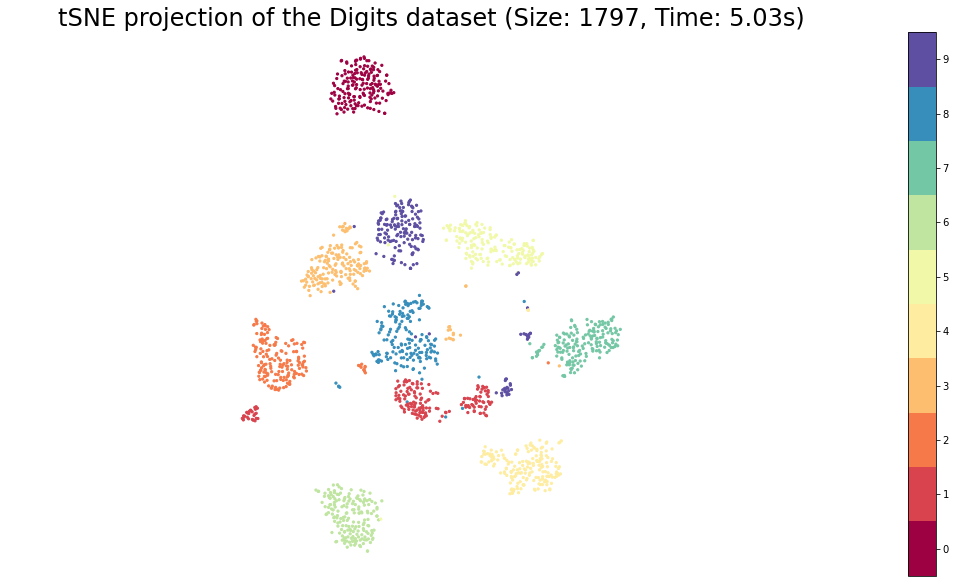

In [13]:
scatterplot_digits(embedding_tsne_digits, 'tSNE', tsne_time_digits)

In [14]:
interactive_scatterplot_digits(digits.images, embedding_tsne_digits, digits.target)

Loading BokehJS ...

# Esempio di UMAP con il dataset Fashion-MNIST

In [15]:
import umap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import os
import requests
%matplotlib notebook
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = [19, 10]

# se il dataset non è presente, lo scarico da opeml
if not os.path.isfile("fashion-mnist.csv"):
    csv_data = requests.get("https://www.openml.org/data/get_csv/18238735/phpnBqZGZ")
    with open("fashion-mnist.csv", "w") as f:
        f.write(csv_data.text)

source_df = pd.read_csv('fashion-mnist.csv')
samples = 5000

data = source_df.iloc[:samples, :784].values.astype(np.float32)
target = source_df['class'].values[:samples]

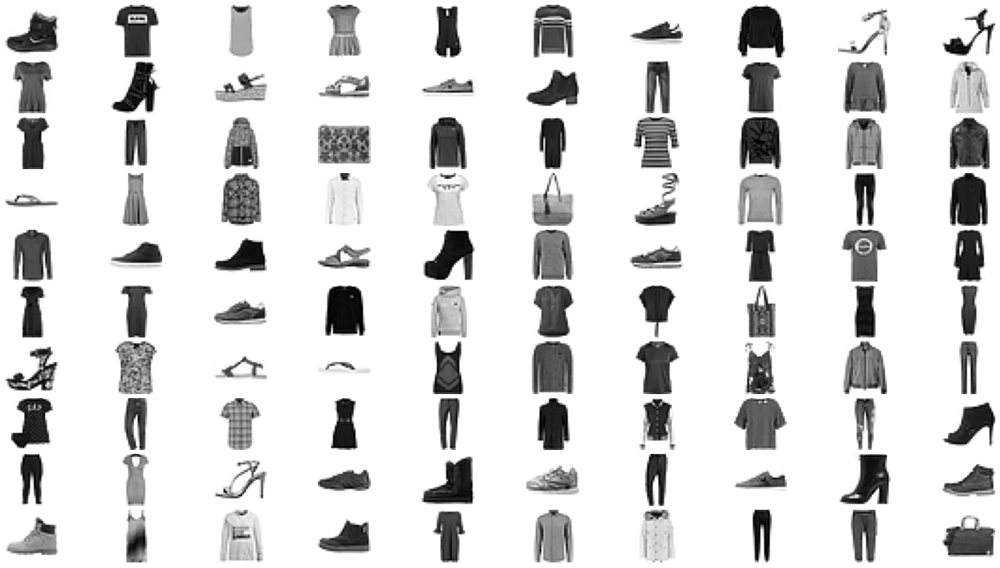

In [16]:
fig, ax_array = plt.subplots(10, 10)
axes = ax_array.flatten()
for i, ax in enumerate(axes):
    img_data = np.asarray(data[i], dtype=np.uint8).reshape(28,28)
    ax.imshow(img_data, cmap='gray_r')
plt.setp(axes, xticks=[], yticks=[], frame_on=False)
plt.tight_layout(h_pad=0.5, w_pad=0.01)

In [17]:
def scatterplot_fashion(embedding, algorithm_name, time):
    plt.scatter(embedding[:, 0], embedding[:, 1], c=target[:], cmap='Spectral', s=5)
    plt.gca().set_aspect('equal', 'datalim')
    #Cleaning up image
    #plt.axis('off')
    plt.tick_params(left=False,
                bottom=False,
                labelleft=False,
                labelbottom=False)
    for pos in ['right', 'top', 'bottom', 'left']:
        plt.gca().spines[pos].set_visible(False)
    
    cbar = plt.colorbar(boundaries=np.arange(11)-0.5)
    cbar.set_ticks(np.arange(10))
    cbar.ax.set_yticklabels(['T-Shirt/top', 'Trousers', 'Pullover','Dress','Coat','Sandal','Shirt','Sneaker','Bag','Ankle boot'])    
    plt.title(f'{algorithm_name} on Fashion dataset (Size: {len(embedding)}, Time: {round(time,2)}s)', fontsize=24);

In [18]:
from io import BytesIO
from PIL import Image
import base64
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10
    
def embeddable_image_fashion(data):
    img_data = np.asarray(data, dtype=np.uint8).reshape(28,28)
    #img_data = 255 - 15 * data.astype(np.uint8)
    image = Image.fromarray(img_data, mode='L').resize((28, 28), Image.BICUBIC)
    buffer = BytesIO()
    image.save(buffer, format='png')
    for_encoding = buffer.getvalue()
    return 'data:image/png;base64,' + base64.b64encode(for_encoding).decode()

def interactive_scatterplot_fashion(data, embedding, target):
    fashion_df = pd.DataFrame(embedding, columns=('x', 'y'))
    fashion_df['digit'] = [str(x) for x in target[:]]
    fashion_df['category'] = fashion_df['digit'].map({'0':'T-shirt/top','1':'Trouser','2':'Pullover','3':'Dress',
                                                      '4':'Coat','5':'Sandal','6':'Shirt','7':'Sneaker','8':'Bag',
                                                      '9':'Ankle boot'})
    fashion_df['image'] = list(map(embeddable_image_fashion, data[:]))

    datasource = ColumnDataSource(fashion_df)
    color_mapping = CategoricalColorMapper(factors=[str(9 - x) for x in range(0,10)],
                                           palette=Spectral10)

    plot_figure = figure(
        title='TSNE projection of the Digits dataset',
        plot_width=900, 
        plot_height=600,
        tools=('pan, wheel_zoom, reset')
    )

    plot_figure.add_tools(HoverTool(tooltips="""
    <div>
        <div>
            <img src='@image' style='float: left; margin: 5px 5px 5px 5px'/>
        </div>
        <div>
            <span style='font-size: 16px; color: #224499'>Category:</span>
            <span style='font-size: 18px'>@category</span>
        </div>
    </div>
    """))

    plot_figure.circle(
        'x',
        'y',
        source=datasource,
        color=dict(field='digit', transform=color_mapping),
        line_alpha=0.6,
        fill_alpha=0.6,
        size=4
    )
    output_notebook()

    show(plot_figure)

In [21]:
import time
start = time.time()
reducer_umap_fashion = umap.UMAP(random_state=42, n_components=2, min_dist=0.2, n_neighbors = 20)
embedding_umap_fashion = reducer_umap_fashion.fit_transform(data)
umap_time_fashion = time.time()-start
print(embedding_umap_fashion)

[[ 9.866135   4.815346 ]
 [-3.1524403  4.796537 ]
 [ 1.2761695  4.7159266]
 ...
 [ 8.621058   1.9355074]
 [ 7.017642  10.089443 ]
 [ 1.3065596  3.7419813]]


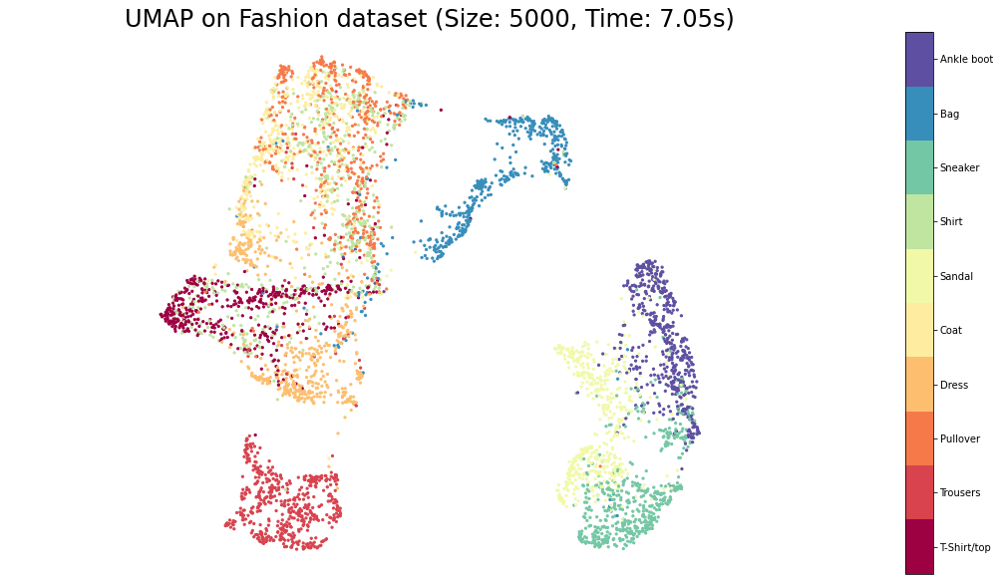

In [22]:
scatterplot_fashion(embedding_umap_fashion, 'UMAP', umap_time_fashion)

In [23]:
interactive_scatterplot_fashion(data, embedding_umap_fashion, target)

Loading BokehJS ...

# Esempio tSNE con Fashion MNIST 

In [24]:
from sklearn.manifold import TSNE

In [25]:
import time
start = time.time()
reducer_tsne_fashion = TSNE(perplexity=50)
embedding_tsne_fashion = reducer_tsne_fashion.fit_transform(data)
tsne_time_fashion = time.time()-start

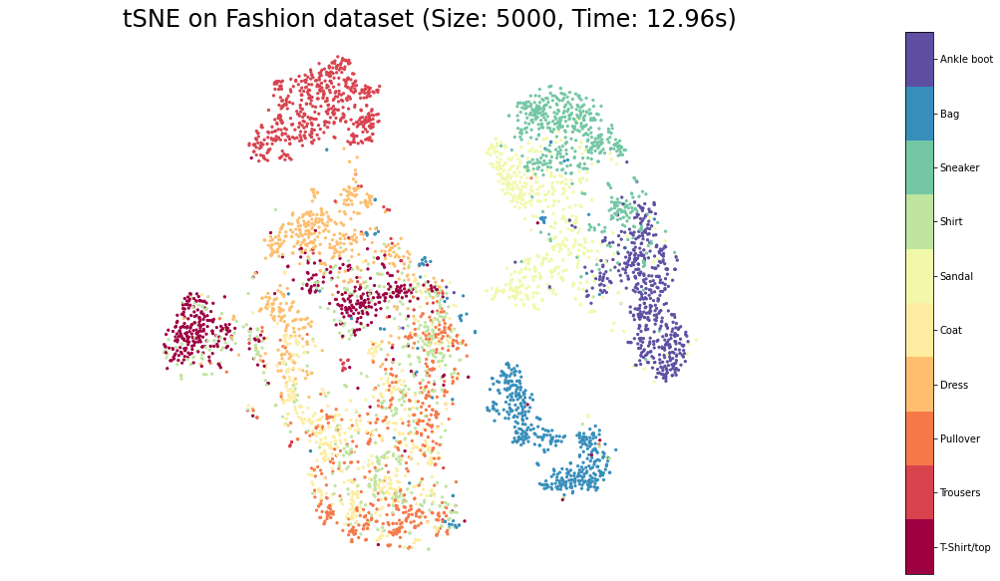

In [26]:
scatterplot_fashion(embedding_tsne_fashion,'tSNE',tsne_time_fashion)

In [27]:
interactive_scatterplot_fashion(data, embedding_tsne_fashion, target)

Loading BokehJS ...

# Some test with 3D UMAP on FASHIONMNIST dataset

In [28]:
reducer_3dumap_fashion = umap.UMAP(random_state=42, n_components=3, min_dist=0.1)
embedding_3dumap_fashion = reducer_3dumap_fashion.fit_transform(data)

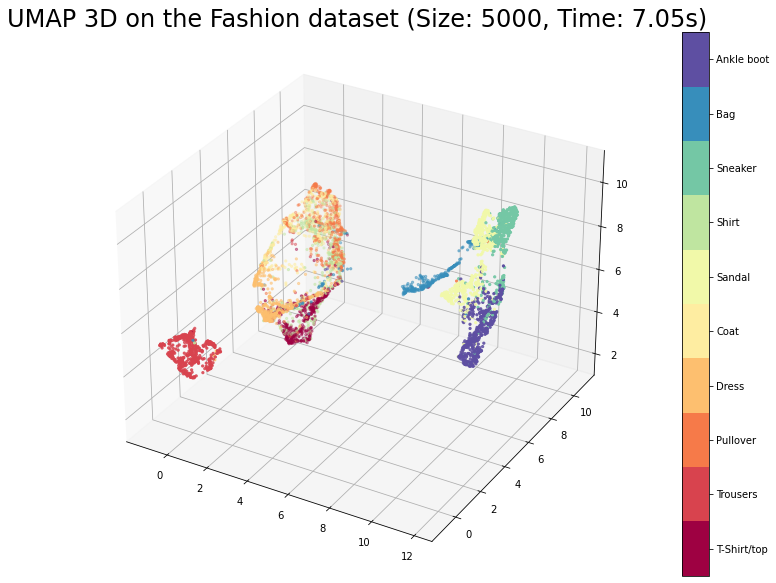

In [29]:
fig = plt.figure()
ax = plt.axes(projection='3d')
sctt = ax.scatter3D(embedding_3dumap_fashion[:,0],embedding_3dumap_fashion[:,1],embedding_3dumap_fashion[:,2],c=target[:], cmap='Spectral', s=5)
cbar = plt.colorbar(sctt, ax=ax, boundaries=np.arange(11)-0.5)
cbar.set_ticks(np.arange(10))
cbar.ax.set_yticklabels(['T-Shirt/top', 'Trousers', 'Pullover','Dress','Coat','Sandal','Shirt','Sneaker','Bag','Ankle boot'])    
plt.title(f'UMAP 3D on the Fashion dataset (Size: {len(embedding_umap_fashion)}, Time: {round(umap_time_fashion,2)}s)', fontsize=24);
plt.show()

# Benchmark tSNE and UMAP on Fashion MNIST 

Entrambi i metodi verrano usati con i loro parametri di default e con diverse dimensioni del dataset

In [111]:
import umap
import numpy as np
import pandas as pd
import os
import requests
import time

# se il dataset non è presente, lo scarico da opeml
if not os.path.isfile("fashion-mnist.csv"):
    csv_data = requests.get("https://www.openml.org/data/get_csv/18238735/phpnBqZGZ")
    with open("fashion-mnist.csv", "w") as f:
        f.write(csv_data.text)

source_df = pd.read_csv('fashion-mnist.csv')
test_sizes = [1000,2500,5000,10000,17500,35000,70000]

# Mettere a True solo se si vogliono eseguire i benchmark, ci vorrà molto tempo!
bench = False 

## tSNE

In [105]:
if bench:
    for sample_size in test_sizes:
        data = source_df.iloc[:sample_size, :784].values.astype(np.float32)

        start = time.time()
        reducer_tsne_fashion = TSNE()
        embedding_tsne_fashion = reducer_tsne_fashion.fit_transform(data)
        tsne_time_fashion = time.time()-start
        
        print(f"{sample_size}: {round(tsne_time_fashion,2)}s")

1000: 2.03s
2500: 3.99s
5000: 7.59s
10000: 19.18s
17500: 39.17s
35000: 100.23s
70000: 294.83s


## UMAP

In [109]:
if bench:
    for sample_size in test_sizes:
        data = source_df.iloc[:sample_size, :784].values.astype(np.float32)
        
        start = time.time()
        reducer_umap_fashion = umap.UMAP()
        embedding_umap_fashion = reducer_umap_fashion.fit_transform(data)
        umap_time_fashion = time.time()-start
        
        print(f"{sample_size}: {round(umap_time_fashion,2)}s")

1000: 2.94s
2500: 6.35s
5000: 4.34s
10000: 6.9s
17500: 6.32s
35000: 11.62s
70000: 23.44s


# Esempio di UMAP con il dataset dei pinguini
----------------
Questo dataset contiene misurazioni della dimensione del becco, delle pinne e del peso di tre specie di pinguini.

In [30]:
import numpy as np
from sklearn.datasets import load_digits
from sklearn.preprocessing import StandardScaler
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
%matplotlib notebook
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = [19, 10]

In [31]:
penguins = pd.read_csv("https://github.com/allisonhorst/palmerpenguins/raw/5b5891f01b52ae26ad8cb9755ec93672f49328a8/data/penguins_size.csv")
penguins.head()

,species_short,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE


In [32]:
penguins = penguins.dropna()
penguins.species_short.value_counts()

Adelie       146
Gentoo       120
Chinstrap     68
Name: species_short, dtype: int64

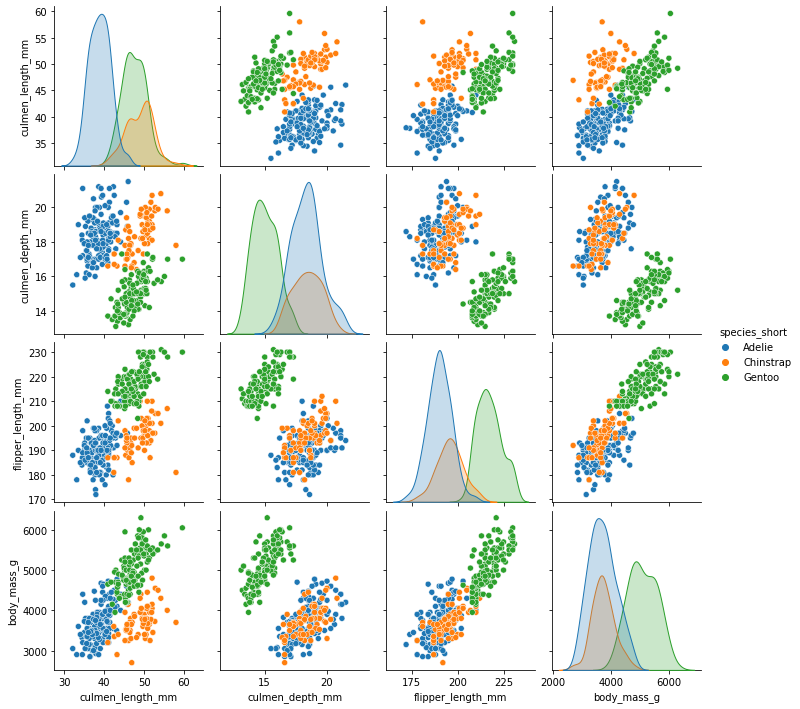

In [33]:
sns.pairplot(penguins, hue='species_short')

Come si può vedere, dato che abbiamo 4 dimensioni, non è molto difficile capire come funzionano questi grafici ma nemmeno così ovvio. Riducendo la dimensionalità e mantenendo la struttura dei dati, possiamo ottenere una visualizzazione dei dati che ci permette di vedere questi dati in modo più chiaro.

In [34]:
import umap
reducer = umap.UMAP(min_dist=0.8)

Prima di iniziare a lavorare con i dati dobbiamo ripulirli un pochino, ci interessano solo le colonne che contengono le misurazioni e dato che ognuna usa una scala diversa, li normalizziamo (numero di deviazioni standard dalla media) in modo da poterli confrontare.

In [35]:
penguin_data = penguins[
    [
        "culmen_length_mm",
        "culmen_depth_mm",
        "flipper_length_mm",
        "body_mass_g",
    ]
].values
scaled_penguin_data = StandardScaler().fit_transform(penguin_data)
scaled_penguin_data

array([[-0.89765322,  0.78348666, -1.42952144, -0.57122888],
       [-0.82429023,  0.12189602, -1.07240838, -0.50901123],
       [-0.67756427,  0.42724555, -0.42960487, -1.19340546],
       ...,
       [ 1.17485108, -0.74326098,  1.49880565,  1.91747742],
       [ 0.22113229, -1.20128527,  0.78457953,  1.23308319],
       [ 1.08314735, -0.53969463,  0.85600214,  1.48195382]])

Ora dobbiamo fare training del nostro reducer. UMAP usa lo stesso formato di `sklearn` e ha un metodo `fit` a cui passare i dati del modello da cui vogliamo imparare. Dato che il nostro obbiettivo è avere dei dati ridotti e pronti per la rappresentazione, useremo `fit_transform` che oltre a fare le stesse cose di fit, ritorna i valori come un arrray di numpy.

In [36]:
embedding = reducer.fit_transform(scaled_penguin_data)
embedding.shape

(334, 2)

Text(0.5, 1.0, 'UMAP projection of the Penguin dataset')

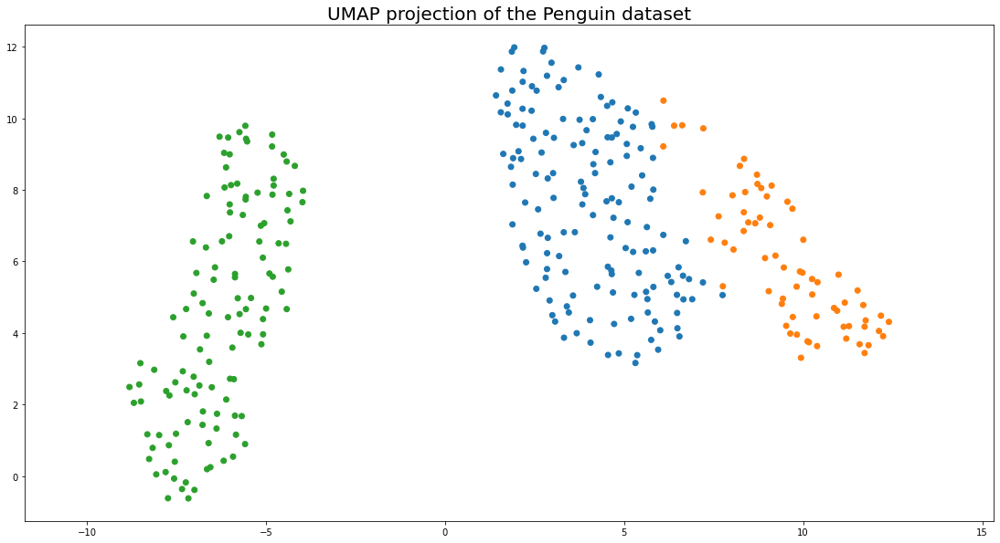

In [37]:
plt.scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=[sns.color_palette()[x] for x in penguins.species_short.map({"Adelie":0, "Chinstrap":1, "Gentoo":2})])
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the Penguin dataset', fontsize=20)

## Fonti
* https://arxiv.org/abs/1802.03426v1
* https://lvdmaaten.github.io/publications/papers/JMLR_2008.pdf
* https://towardsdatascience.com/how-exactly-umap-works-13e3040e1668
* https://umap-learn.readthedocs.io/
* https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
* https://pair-code.github.io/understanding-umap/
* https://www.youtube.com/watch?v=6BPl81wGGP8
* https://www.youtube.com/watch?v=nq6iPZVUxZU